# Task 1

1. Una homografía 𝐻 es una matriz de 3 × 3. Explique matemáticamente por qué, aunque tiene 9 elementos, solo posee 8 grados de libertad (GDL)
a. Adicionalmente, respoda. Si tuviéramos una cámara que solo rota sobre su eje óptico (sin traslación ni cambio de perspectiva), ¿la matriz de transformación sigue teniendo 8 GDL o se reduce? Demuestre la estructura de dicha matriz simplificad

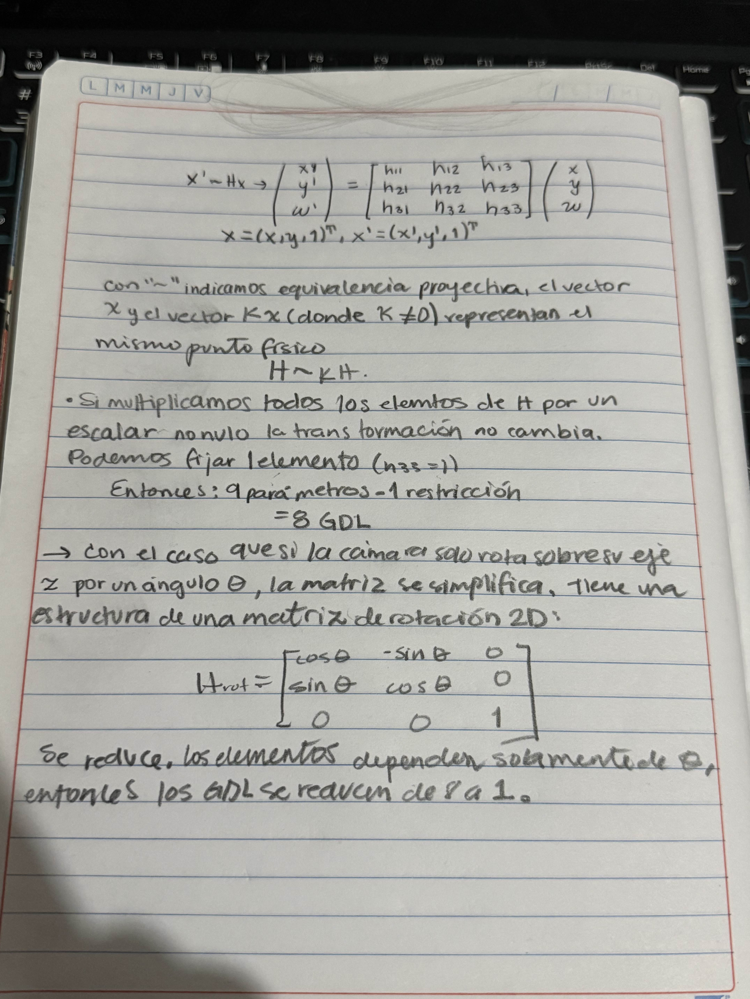

In [1]:
from IPython.display import Image, display

display(Image(filename='IMG_7314.jpg', width=500))

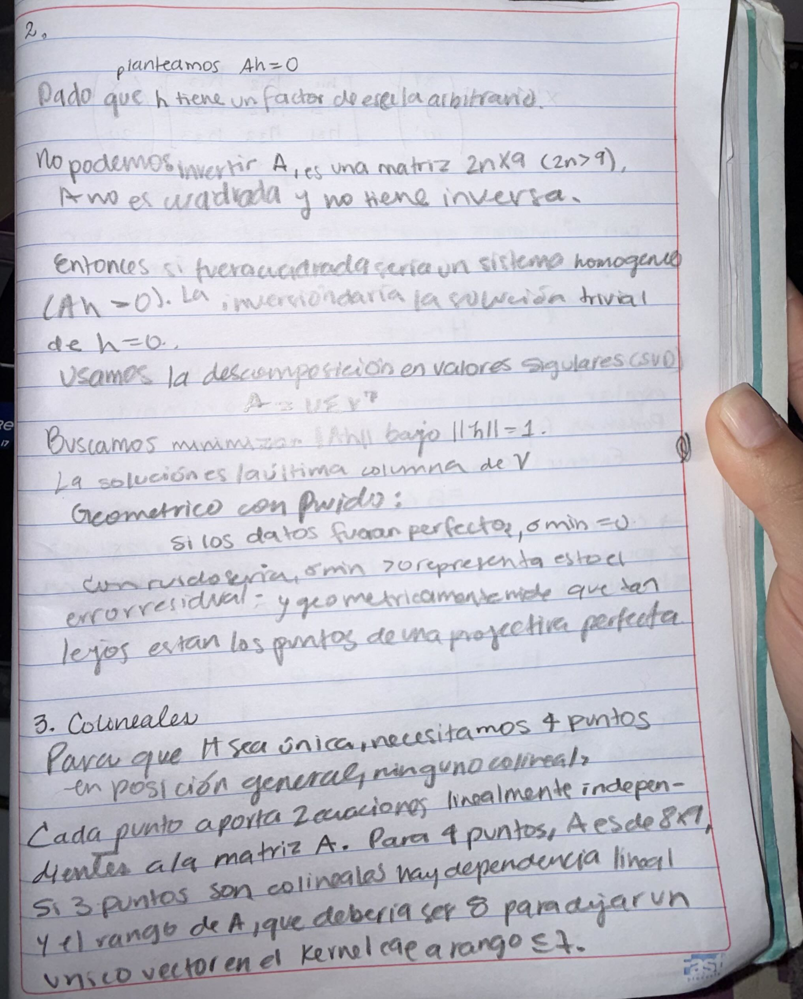

In [2]:
# Task 2 & 3

display(Image(filename='IMG_7326.jpg', width=500))

Task 2

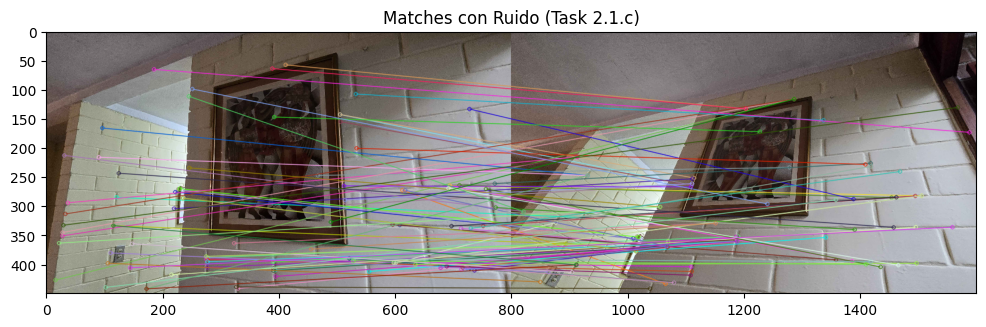

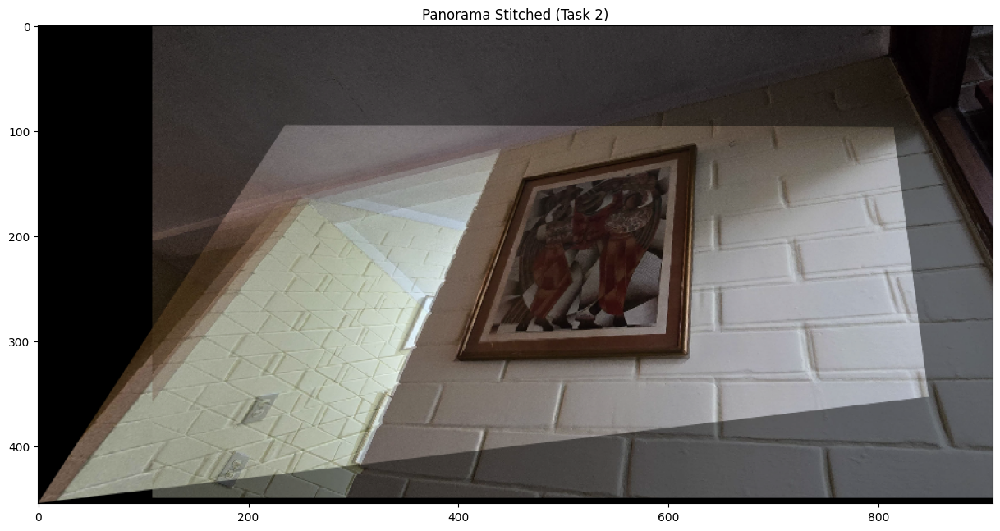

In [25]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import math

def preparar_imagenes(path1, path2):
    img1 = cv2.imread(path1)
    img2 = cv2.imread(path2)
    
    
    fijo_ancho = 800
    img1 = cv2.resize(img1, (fijo_ancho, int(img1.shape[0] * fijo_ancho / img1.shape[1])))
    img2 = cv2.resize(img2, (fijo_ancho, int(img2.shape[0] * fijo_ancho / img2.shape[1])))
    
    return img1, img2

def obtener_matches(img1, img2):
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(img1, None)
    kp2, des2 = sift.detectAndCompute(img2, None)
    
    bf = cv2.BFMatcher(cv2.NORM_L2)
    matches = bf.match(des1, des2)
    matches = sorted(matches, key=lambda x: x.distance)
    
    img_ruido = cv2.drawMatches(img1, kp1, img2, kp2, matches[:100], None, flags=2)
    plt.figure(figsize=(12,6))
    plt.imshow(cv2.cvtColor(img_ruido, cv2.COLOR_BGR2RGB))
    plt.title("Matches con Ruido (Task 2.1.c)")
    plt.show()
    
    return kp1, kp2, matches

def normalizar_pts(pts):
    media = np.mean(pts, axis=0)
    desv = np.std(pts, axis=0) + 1e-8
    T = np.array([[1/desv[0], 0, -media[0]/desv[0]],
                  [0, 1/desv[1], -media[1]/desv[1]],
                  [0, 0, 1]])
    pts_norm = (pts - media) / desv
    return pts_norm, T

def calcular_homografia_dlt(pts_src, pts_dst):
    pts_src_n, T_src = normalizar_pts(pts_src)
    pts_dst_n, T_dst = normalizar_pts(pts_dst)
    
    A = []
    for i in range(len(pts_src_n)):
        x, y = pts_src_n[i][0], pts_src_n[i][1]
        u, v = pts_dst_n[i][0], pts_dst_n[i][1]
        A.append([-x, -y, -1, 0, 0, 0, x*u, y*u, u])
        A.append([0, 0, 0, -x, -y, -1, x*v, y*v, v])
        
    A = np.array(A)
    _, _, Vh = np.linalg.svd(A)
    H_n = Vh[-1, :].reshape(3, 3)
    
    H = np.linalg.inv(T_dst) @ H_n @ T_src
    return H / H[2, 2]

def ejecutar_ransac(kp1, kp2, matches, umbral=5.0):
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches])
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches])
    
    max_inliers = 0
    best_h = None
    N = 1000
    count = 0
    prob_exito = 0.99
    
    while count < N:
        idx = np.random.choice(len(matches), 4, replace=False) 
        H_temp = calcular_homografia_dlt(src_pts[idx], dst_pts[idx]) 
        
    
        pts_h = np.hstack([src_pts, np.ones((len(src_pts), 1))])
        proj = (H_temp @ pts_h.T).T
        proj = proj[:, :2] / (proj[:, 2:3] + 1e-10)
        
        dist = np.linalg.norm(dst_pts - proj, axis=1)
        inliers_mask = dist < umbral
        num_inliers = np.sum(inliers_mask)
        
        if num_inliers > max_inliers:
            max_inliers = num_inliers
            best_h = H_temp
            
            w = num_inliers / len(matches)
            if w > 0:
                N = math.log(1 - prob_exito) / (math.log(1 - w**4 + 1e-10)) 
        
        count += 1
        if count > 5000: break

    return best_h

def crear_panorama(img1, img2, H):
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    
    pts1 = np.float32([[0,0],[0,h1],[w1,h1],[w1,0]]).reshape(-1,1,2)
    pts1_ = cv2.perspectiveTransform(pts1, H)
    pts2 = np.float32([[0,0],[0,h2],[w2,h2],[w2,0]]).reshape(-1,1,2)
    
    pts_all = np.concatenate((pts1_, pts2), axis=0)
    [xmin, ymin] = np.int32(pts_all.min(axis=0).ravel() - 0.5)
    [xmax, ymax] = np.int32(pts_all.max(axis=0).ravel() + 0.5)
    
    
    T = np.array([[1, 0, -xmin], [0, 1, -ymin], [0, 0, 1]])
    
    panorama = cv2.warpPerspective(img1, T @ H, (xmax-xmin, ymax-ymin))
    
    roi = panorama[-ymin:h2-ymin, -xmin:w2-xmin]
    cv2.addWeighted(roi, 0.5, img2, 0.5, 0, roi)
    
    return panorama

imagen_a, imagen_b = preparar_imagenes('image2.jpg', 'image3.jpg') 
k1, k2, m_total = obtener_matches(imagen_a, imagen_b)
homografia_final = ejecutar_ransac(k1, k2, m_total, umbral=10.0)
resultado = crear_panorama(imagen_a, imagen_b, homografia_final)

plt.figure(figsize=(15,10))
plt.imshow(cv2.cvtColor(resultado, cv2.COLOR_BGR2RGB))
plt.title("Panorama Stitched (Task 2)")
plt.show()